Importing dependencies

In [1]:
import torch
import torch.nn as nn
from torch.nn import functional as F
import os
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
import torchvision.utils as vutils

Defining Autoencoder Architecture

Hyper parameters

In [2]:
# Input image size for the network
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 100

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5

In [17]:
transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]) # Normalizing between -1 to 1
])

dataset = ImageFolder(root='/home/piyush/ADRL_A1/afhq/train', transform=transform)

dataloader = DataLoader(dataset, batch_size=256, shuffle=True)

In [18]:
device = ("cuda" if torch.cuda.is_available() else "cpu")

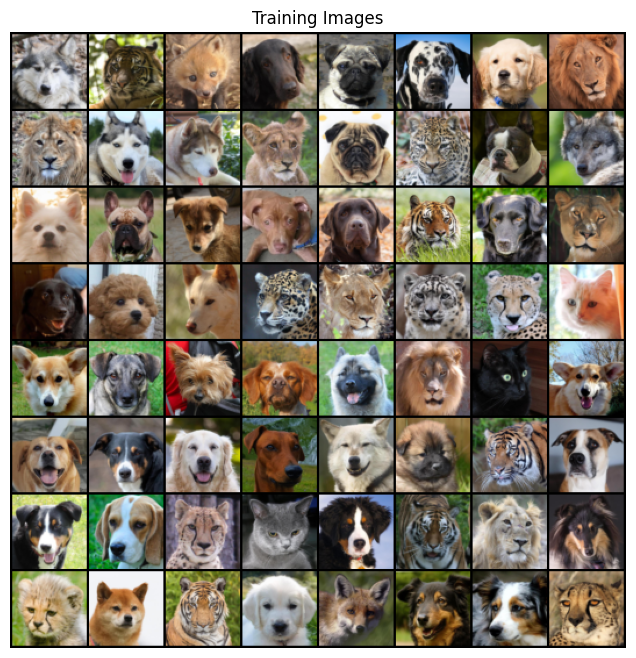

In [19]:
# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [23]:
# custom weights initialization called on ``netG`` and ``netD``
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

Generator

In [24]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator,self).__init__()
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 16 x 16``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf) x 32 x 32``
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 64 x 64``
        )

    def forward(self, input):
        return self.main(input)

Discriminator

In [25]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator,self).__init__()
        self.main = nn.Sequential(
            # input is ``(nc) x 64 x 64``
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

Loss Functions and Optimizers

In [26]:
Gen = Generator().to(device)
Disc = Discriminator().to(device)

In [27]:
# Initialize the ``BCELoss`` function
loss = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(Gen.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(Disc.parameters(), lr=lr, betas=(beta1, 0.999))

Training

In [52]:
num_epochs = 100
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

In [54]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
G_losses_epoch_vise = []
D_losses_epoch_vise = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    Gloss = 0
    Dloss = 0
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        Disc.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = Disc(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = loss(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = Gen(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = Disc(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = loss(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        Gen.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = Disc(fake).view(-1)
        # Calculate G's loss based on this output
        errG = loss(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i  == 0 or i == len(dataloader):
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())
        Gloss += errG.item()
        Dloss += errD.item()

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 50 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = Gen(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1
    G_losses_epoch_vise.append(Gloss)
    D_losses_epoch_vise.append(Dloss)

Starting Training Loop...


[0/100][0/34]	Loss_D: 0.6700	Loss_G: 0.7794	D(x): 0.9488	D(G(z)): 0.4596 / 0.4596
[1/100][0/34]	Loss_D: 1.0640	Loss_G: 0.4925	D(x): 0.8983	D(G(z)): 0.6126 / 0.6126
[2/100][0/34]	Loss_D: 0.7501	Loss_G: 0.8792	D(x): 0.9162	D(G(z)): 0.4549 / 0.4549
[3/100][0/34]	Loss_D: 0.9011	Loss_G: 0.6591	D(x): 0.8573	D(G(z)): 0.5204 / 0.5204
[4/100][0/34]	Loss_D: 1.1227	Loss_G: 0.4701	D(x): 0.8814	D(G(z)): 0.6266 / 0.6266
[5/100][0/34]	Loss_D: 1.1678	Loss_G: 0.4343	D(x): 0.9025	D(G(z)): 0.6501 / 0.6501
[6/100][0/34]	Loss_D: 1.1409	Loss_G: 0.4520	D(x): 0.9002	D(G(z)): 0.6393 / 0.6393
[7/100][0/34]	Loss_D: 0.7711	Loss_G: 1.1534	D(x): 0.9048	D(G(z)): 0.4230 / 0.4230
[8/100][0/34]	Loss_D: 0.8174	Loss_G: 0.7404	D(x): 0.8686	D(G(z)): 0.4825 / 0.4825
[9/100][0/34]	Loss_D: 0.8530	Loss_G: 0.7609	D(x): 0.8338	D(G(z)): 0.4772 / 0.4772
[10/100][0/34]	Loss_D: 1.0563	Loss_G: 0.5084	D(x): 0.8911	D(G(z)): 0.6043 / 0.6043
[11/100][0/34]	Loss_D: 1.0302	Loss_G: 0.5485	D(x): 0.8810	D(G(z)): 0.5838 / 0.5838
[12/100][0/34]

In [71]:
# model_save_path = "/home/piyush/ADRL_A22"
model_save_path = "/home/piyush/ADRL_A22"
os.makedirs(os.path.dirname(model_save_path), exist_ok=True)
torch.save({
                'epoch': epoch,
                'model_state_dict': Gen.state_dict(),
                'optimizer_state_dict': optimizerG.state_dict(),
                'loss': errG.item(),
            }, model_save_path)

Generated Sample Images

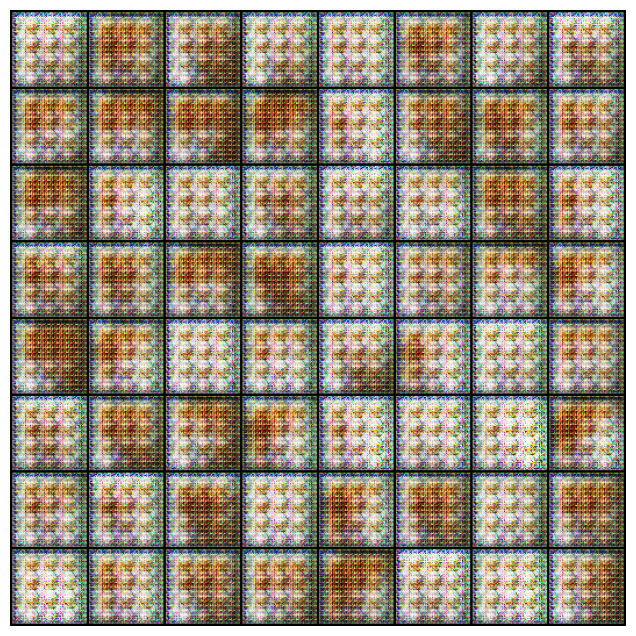

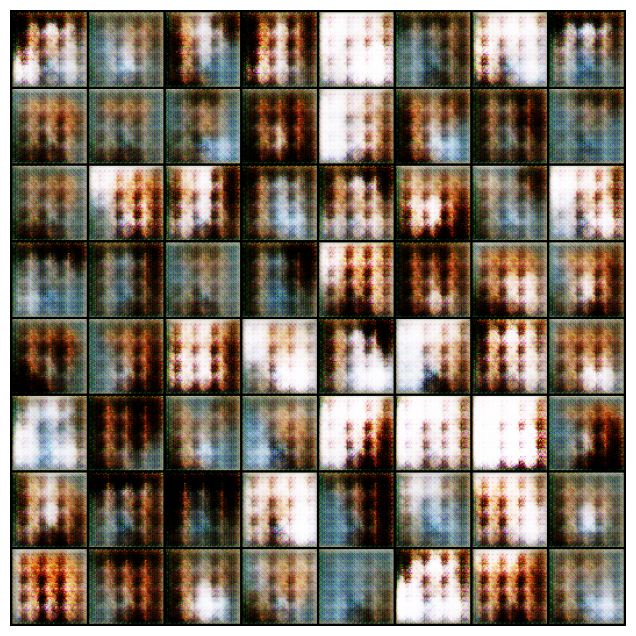

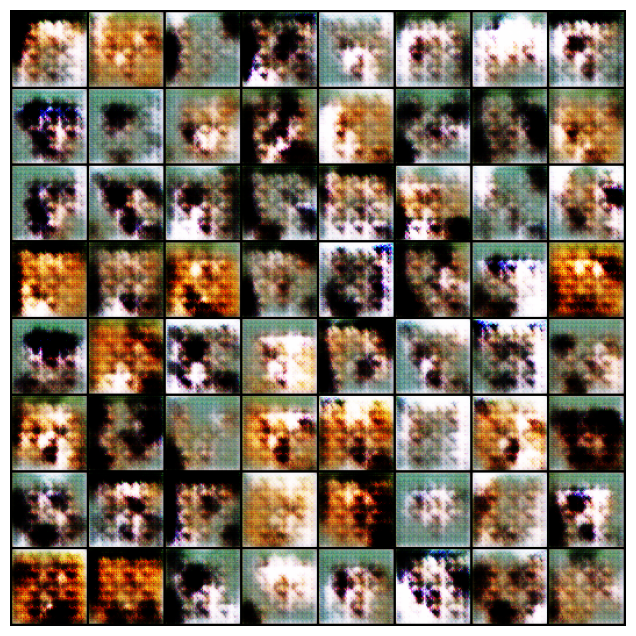

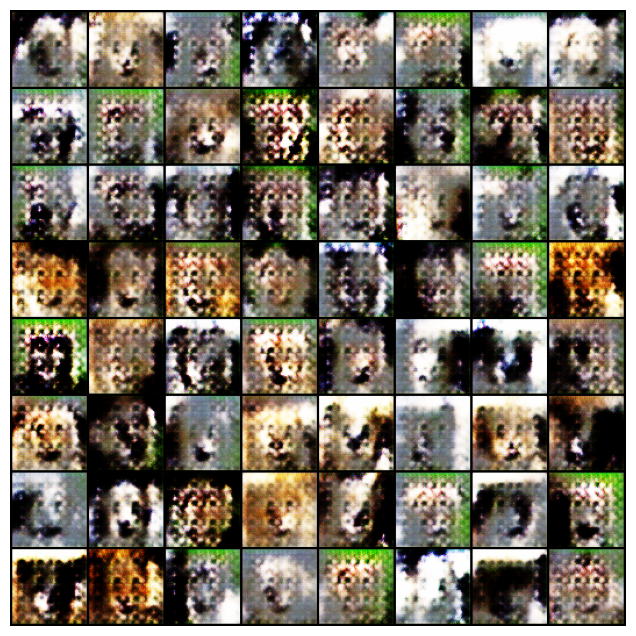

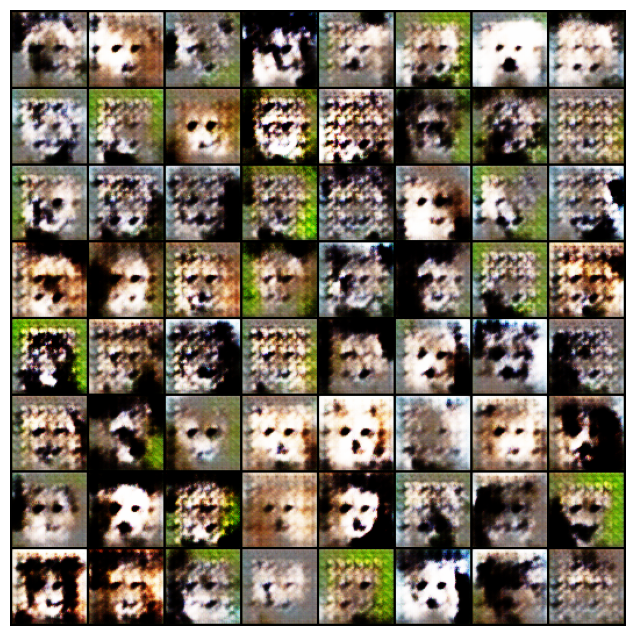

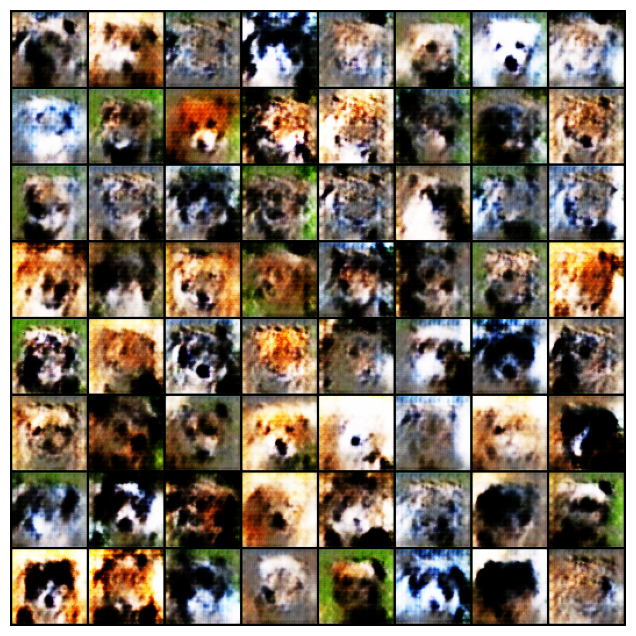

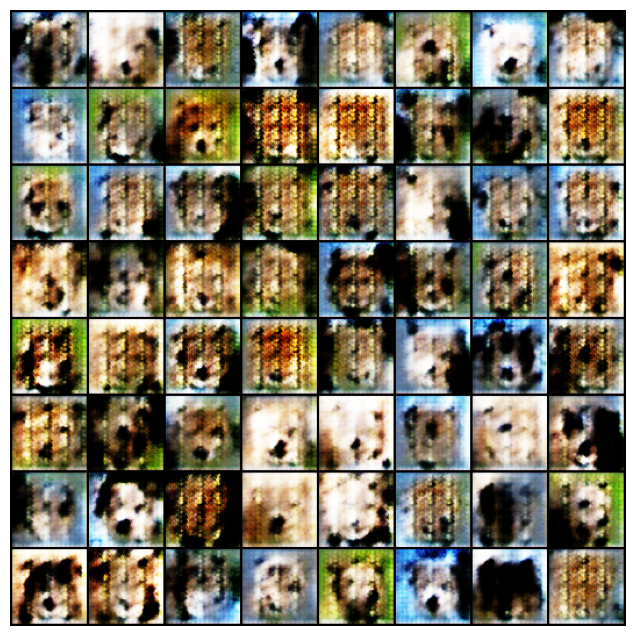

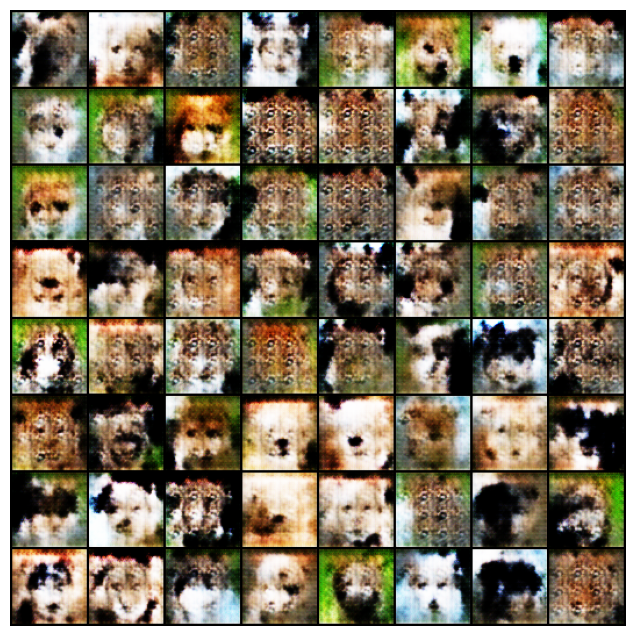

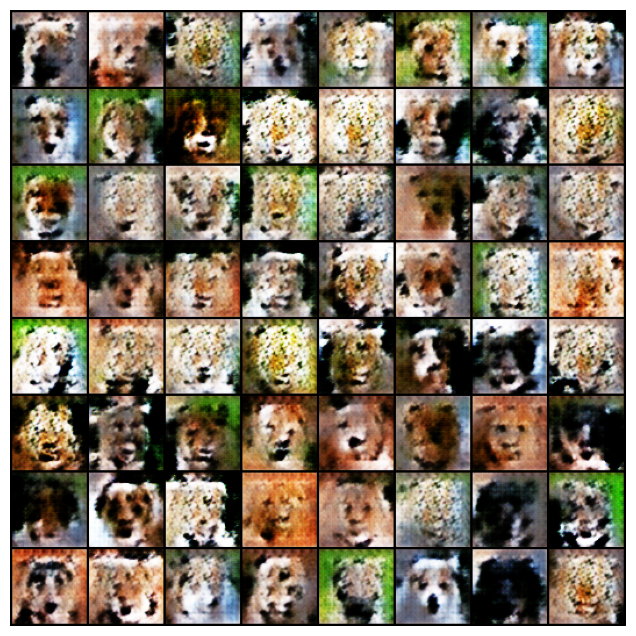

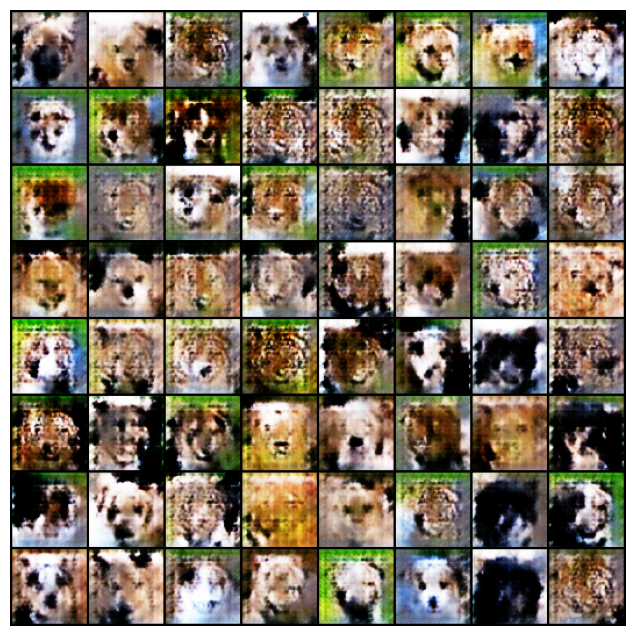

In [62]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming img_list contains a list of 64 images
# You can modify this value based on the actual number of images in img_list

num_images = len(img_list)

# Calculate the number of rows and columns for your grid (e.g., 8x8)
grid_size = 8

# Define the size of each grid
grid_width = 8  # Adjust this value for the desired size
grid_height = 8  # Adjust this value for the desired size

for image_index in range(0,num_images,7):
    fig, ax = plt.subplots(1, 1, figsize=(grid_width, grid_height))
    ax.imshow(np.transpose(img_list[image_index], (1, 2, 0)))
    ax.axis('off')
    plt.show()


Plots

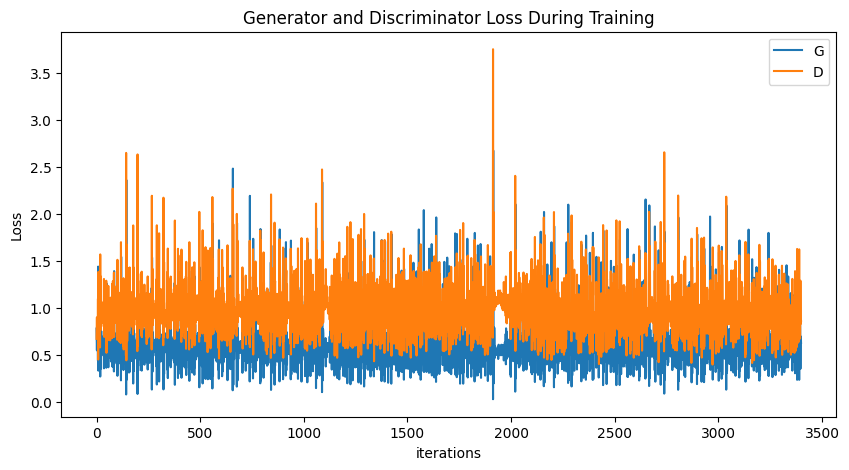

In [66]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

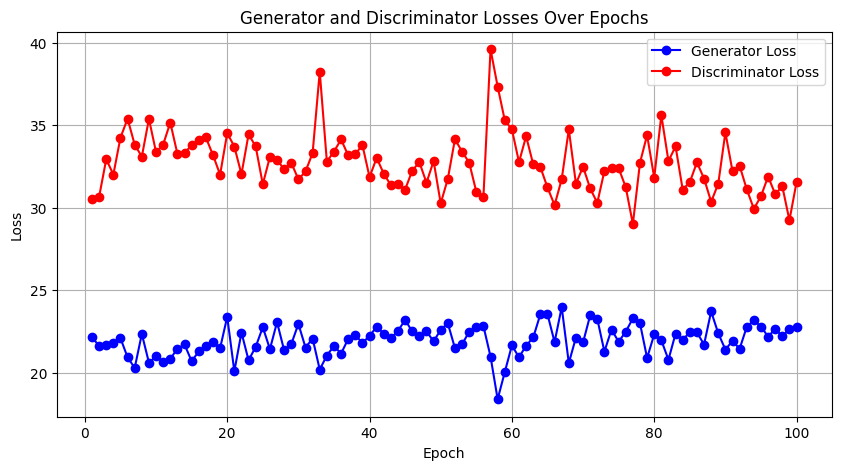

In [65]:
plt.figure(figsize=(10, 5))
plt.plot(range(1, num_epochs + 1), G_losses_epoch_vise, label="Generator Loss", color="blue", marker='o', linestyle='-')
plt.plot(range(1, num_epochs + 1), D_losses_epoch_vise, label="Discriminator Loss", color="red", marker='o', linestyle='-')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Generator and Discriminator Losses Over Epochs")
plt.grid()
plt.show()
